<a href="https://colab.research.google.com/github/SpartanC322/AILaptopPrices/blob/main/Ai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Stage 1**
***Describe Data***

Data is a CSV of Laptops containing their features, brand, model, a previous price and the latest price.

Kaggle link: https://www.kaggle.com/datasets/kuchhbhi/latest-laptop-price-list

In [44]:
import pandas as pd
import seaborn as se
import io
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

In [5]:
from google.colab import files
up = files.upload()

Saving Cleaned_Laptop_data.csv to Cleaned_Laptop_data.csv


In [7]:
df_laptop = pd.read_csv(io.StringIO(up['Cleaned_Laptop_data.csv'].decode('utf-8')))
%load_ext google.colab.data_table

The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table


In [8]:
df_laptop.columns

Index(['brand', 'model', 'processor_brand', 'processor_name',
       'processor_gnrtn', 'ram_gb', 'ram_type', 'ssd', 'hdd', 'os', 'os_bit',
       'graphic_card_gb', 'weight', 'display_size', 'warranty', 'Touchscreen',
       'msoffice', 'latest_price', 'old_price', 'discount', 'star_rating',
       'ratings', 'reviews'],
      dtype='object')

In [9]:
df_laptop = df_laptop.dropna(axis=0)

In [28]:
df_laptop.shape

(657, 23)

In [29]:
df_laptop.dtypes

brand               object
model               object
processor_brand     object
processor_name      object
processor_gnrtn     object
ram_gb              object
ram_type            object
ssd                 object
hdd                 object
os                  object
os_bit              object
graphic_card_gb      int64
weight              object
display_size        object
warranty             int64
Touchscreen         object
msoffice            object
latest_price         int64
old_price            int64
discount             int64
star_rating        float64
ratings              int64
reviews              int64
dtype: object

In [31]:
df_laptop.describe()

,graphic_card_gb,warranty,latest_price,old_price,discount,star_rating,ratings,reviews
count,657.000000,657.000000,657.000000,657.000000,657.000000,657.000000,657.000000,657.000000
mean,1.175038,0.686454,79343.213090,89624.608828,17.936073,3.040487,348.680365,43.397260
std,2.041069,0.609140,49608.231608,57180.782571,10.816606,1.944192,959.138270,118.407956
min,0.000000,0.000000,19590.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,46990.000000,55999.000000,10.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,64990.000000,79690.000000,18.000000,4.100000,18.000000,3.000000
75%,2.000000,1.000000,89998.000000,110900.000000,25.000000,4.400000,138.000000,18.000000
max,8.000000,3.000000,441990.000000,377798.000000,57.000000,5.000000,6725.000000,1014.000000


In [32]:
df_laptop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 657 entries, 0 to 895
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   brand            657 non-null    object 
 1   model            657 non-null    object 
 2   processor_brand  657 non-null    object 
 3   processor_name   657 non-null    object 
 4   processor_gnrtn  657 non-null    object 
 5   ram_gb           657 non-null    object 
 6   ram_type         657 non-null    object 
 7   ssd              657 non-null    object 
 8   hdd              657 non-null    object 
 9   os               657 non-null    object 
 10  os_bit           657 non-null    object 
 11  graphic_card_gb  657 non-null    int64  
 12  weight           657 non-null    object 
 13  display_size     657 non-null    object 
 14  warranty         657 non-null    int64  
 15  Touchscreen      657 non-null    object 
 16  msoffice         657 non-null    object 
 17  latest_price    

In [34]:
df_laptop.head()

,brand,model,processor_brand,processor_name,processor_gnrtn,ram_gb,ram_type,ssd,hdd,os,...,display_size,warranty,Touchscreen,msoffice,latest_price,old_price,discount,star_rating,ratings,reviews
0,Lenovo,A6-9225,1,A6-9225 Processor,10,4,2,0,1024,Windows,...,Missing,0,0,No,24990,32790,23,3.7,63,12
1,Lenovo,Ideapad,1,APU Dual,10,4,2,0,512,Windows,...,Missing,0,0,No,19590,21325,8,3.6,1894,256
2,Avita,PURA,1,APU Dual,10,4,2,128,0,Windows,...,Missing,0,0,No,19990,27990,28,3.7,1153,159
3,Avita,PURA,1,APU Dual,10,4,2,128,0,Windows,...,Missing,0,0,No,21490,27990,23,3.7,1153,159
4,Avita,PURA,1,APU Dual,10,4,2,256,0,Windows,...,Missing,0,0,No,24990,33490,25,3.7,1657,234


8     391
16    149
4     114
32      3
Name: ram_gb, dtype: int64


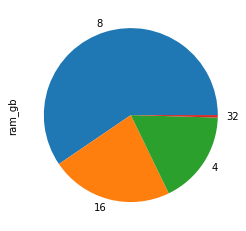

In [36]:
h = df_laptop['ram_gb'].value_counts()
print(h)

h.plot(kind='pie')

2    557
4     47
3     25
1     14
0     11
5      3
Name: ram_type, dtype: int64


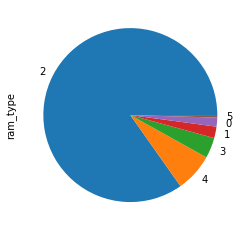

In [37]:
h = df_laptop['ram_type'].value_counts()
print(h)

h.plot(kind='pie')

Windows    593
DOS         36
Mac         28
Name: os, dtype: int64


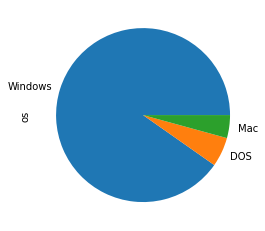

In [38]:
h = df_laptop['os'].value_counts()
print(h)

h.plot(kind='pie')

64-bit    557
32-bit    100
Name: os_bit, dtype: int64


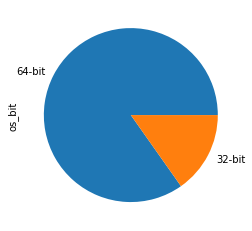

In [39]:
h = df_laptop['os_bit'].value_counts()
print(h)

h.plot(kind='pie')

In [40]:
print(df_laptop.groupby('ram_gb').mean())

        graphic_card_gb  warranty   latest_price      old_price   discount  \
ram_gb                                                                       
16             2.214765  0.765101  124282.523490  133672.120805  16.859060   
32             4.000000  0.666667  168959.666667  185855.666667   7.666667   
4              0.385965  0.535088   47159.254386   49247.192982  15.684211   
8              0.987212  0.700767   70913.966752   83873.337596  19.081841   

        star_rating     ratings    reviews  
ram_gb                                      
16         2.496644   71.275168   9.993289  
32         1.666667    1.000000   0.333333  
4          3.200877  732.859649  94.754386  
8          3.211509  345.048593  41.483376  


In [41]:
print(df_laptop.groupby('os').mean())

         graphic_card_gb  warranty   latest_price      old_price   discount  \
os                                                                            
DOS             3.500000  0.055556  126041.944444  118928.972222  11.944444   
Mac             0.000000  1.000000  151707.857143  163650.000000   7.107143   
Windows         1.089376  0.709949   73091.333895   84350.295110  18.811130   

         star_rating      ratings     reviews  
os                                             
DOS         3.647222   801.666667  112.027778  
Mac         4.717857  1207.535714  117.535714  
Windows     2.924452   280.627319   35.730185  


In [10]:
print("processor brands: " , df_laptop.processor_brand.unique())
print("processor Generation: " , df_laptop.processor_gnrtn.unique())
print("Ram Type: " , df_laptop.ram_type.unique())
print("Ram Size: " , df_laptop.ram_gb.unique())
print("SSD Size: " , df_laptop.ssd.unique())
print("HardDrive size: " , df_laptop.hdd.unique())
print("Touchscreen: " , df_laptop.Touchscreen.unique())

processor brands:  ['AMD' 'Intel' 'M1' 'MediaTek' 'Qualcomm']
processor Generation:  ['10th' 'Missing' '11th' '7th' '8th' '9th' '4th' '12th']
Ram Type:  ['DDR4' 'LPDDR4X' 'LPDDR4' 'DDR5' 'DDR3' 'LPDDR3']
Ram Size:  ['4 GB GB' '8 GB GB' '32 GB GB' '16 GB GB']
SSD Size:  ['0 GB' '128 GB' '256 GB' '32 GB' '512 GB' '1024 GB' '2048 GB' '3072 GB']
HardDrive size:  ['1024 GB' '512 GB' '0 GB' '2048 GB']
Touchscreen:  ['No' 'Yes']


In [11]:
df_laptop.drop(df_laptop[df_laptop.processor_brand == 'Missing'].index, inplace=True)
df_laptop.drop(df_laptop[df_laptop.processor_gnrtn == 'Missing'].index, inplace=True)
df_laptop.drop(df_laptop[df_laptop.ram_type == 'Missing'].index, inplace=True)
df_laptop.drop(df_laptop[df_laptop.ram_gb == 'Missing'].index, inplace=True)
df_laptop.drop(df_laptop[df_laptop.ssd == 'Missing'].index, inplace=True)
df_laptop.drop(df_laptop[df_laptop.hdd == 'Missing'].index, inplace=True)
df_laptop.drop(df_laptop[df_laptop.Touchscreen == 'Missing'].index, inplace=True)

df_laptop['processor_brand'] = df_laptop['processor_brand'].str.replace(r'Intel', '0')
df_laptop['processor_brand'] = df_laptop['processor_brand'].str.replace(r'AMD', '1')
df_laptop['processor_brand'] = df_laptop['processor_brand'].str.replace(r'M1', '2')
df_laptop['processor_brand'] = df_laptop['processor_brand'].str.replace(r'MediaTek', '3')

df_laptop['ram_type'] = df_laptop['ram_type'].str.replace(r'LPDDR3', '1')
df_laptop['ram_type'] = df_laptop['ram_type'].str.replace(r'DDR3', '0')
df_laptop['ram_type'] = df_laptop['ram_type'].str.replace(r'LPDDR4X', '4')
df_laptop['ram_type'] = df_laptop['ram_type'].str.replace(r'LPDDR4', '3')
df_laptop['ram_type'] = df_laptop['ram_type'].str.replace(r'DDR4', '2')
df_laptop['ram_type'] = df_laptop['ram_type'].str.replace(r'DDR5', '5')

df_laptop['processor_gnrtn'] = df_laptop['processor_gnrtn'].str.replace(r'\D', '')
df_laptop['ram_gb'] = df_laptop['ram_gb'].str.replace(r'\D', '')
df_laptop['ssd'] = df_laptop['ssd'].str.replace(r'\D', '')
df_laptop['hdd'] = df_laptop['hdd'].str.replace(r'\D', '')
df_laptop['Touchscreen'] = df_laptop['Touchscreen'].str.replace(r'No', '0')
df_laptop['Touchscreen'] = df_laptop['Touchscreen'].str.replace(r'Yes', '1')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: FutureWarning: The default value of regex will change from True to False in a future version.


In [42]:
df_laptop.head()

,brand,model,processor_brand,processor_name,processor_gnrtn,ram_gb,ram_type,ssd,hdd,os,...,display_size,warranty,Touchscreen,msoffice,latest_price,old_price,discount,star_rating,ratings,reviews
0,Lenovo,A6-9225,1,A6-9225 Processor,10,4,2,0,1024,Windows,...,Missing,0,0,No,24990,32790,23,3.7,63,12
1,Lenovo,Ideapad,1,APU Dual,10,4,2,0,512,Windows,...,Missing,0,0,No,19590,21325,8,3.6,1894,256
2,Avita,PURA,1,APU Dual,10,4,2,128,0,Windows,...,Missing,0,0,No,19990,27990,28,3.7,1153,159
3,Avita,PURA,1,APU Dual,10,4,2,128,0,Windows,...,Missing,0,0,No,21490,27990,23,3.7,1153,159
4,Avita,PURA,1,APU Dual,10,4,2,256,0,Windows,...,Missing,0,0,No,24990,33490,25,3.7,1657,234


In [47]:
df_temp = df_laptop.copy()

In [51]:
df_temp['hdd'] = pd.to_numeric(df_temp['hdd'])
df_temp['ssd'] = pd.to_numeric(df_temp['ssd'])
df_temp['ram_gb'] = pd.to_numeric(df_temp['ram_gb'])

hdd


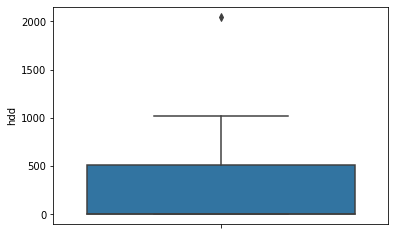

ssd


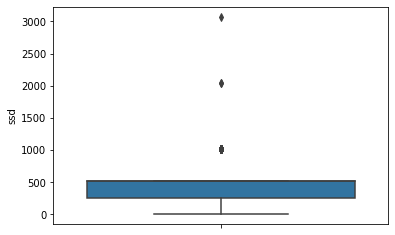

ram


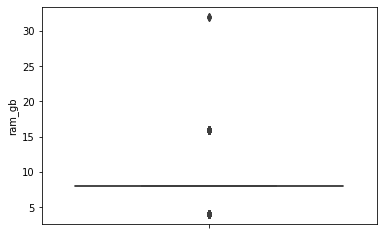

stars


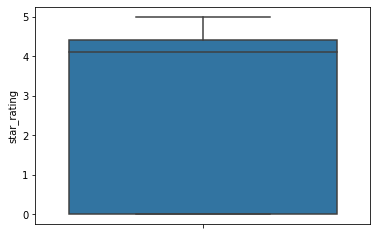

In [53]:
#hdd
print('hdd')
se.boxplot(y = df_temp['hdd'])
plt.show()

#ssd
print('ssd')
se.boxplot(y = df_temp['ssd'])
plt.show()

#RAM
print('ram')
se.boxplot(y = df_temp['ram_gb'])
plt.show()

#stars
print('stars')
se.boxplot(y = df_temp['star_rating'])
plt.show()

In [56]:
df_laptop.corr()

,graphic_card_gb,warranty,latest_price,old_price,discount,star_rating,ratings,reviews
graphic_card_gb,1.000000,-0.056329,0.478936,0.446016,0.005065,-0.022072,-0.070910,-0.057705
warranty,-0.056329,1.000000,0.004471,0.023416,0.086490,0.128641,0.059400,0.039709
latest_price,0.478936,0.004471,1.000000,0.731400,-0.279949,-0.136242,-0.160739,-0.164460
old_price,0.446016,0.023416,0.731400,1.000000,0.151552,-0.048665,-0.147532,-0.158282
discount,0.005065,0.086490,-0.279949,0.151552,1.000000,0.077772,-0.051920,-0.037853
star_rating,-0.022072,0.128641,-0.136242,-0.048665,0.077772,1.000000,0.236827,0.237612
ratings,-0.070910,0.059400,-0.160739,-0.147532,-0.051920,0.236827,1.000000,0.971850
reviews,-0.057705,0.039709,-0.164460,-0.158282,-0.037853,0.237612,0.971850,1.000000


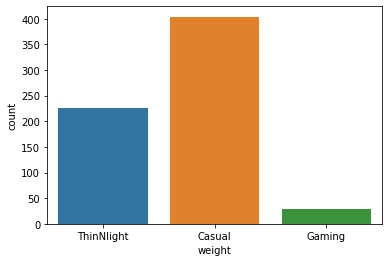

In [59]:
se.countplot(data = df_laptop, x = 'weight')

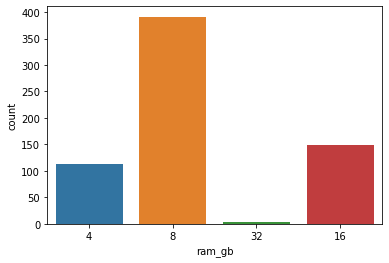

In [60]:
se.countplot(data = df_laptop, x = 'ram_gb')

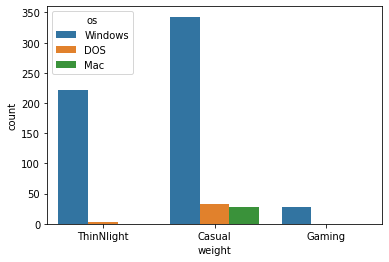

In [57]:
se.countplot(data = df_laptop, x = 'weight', hue = 'os')

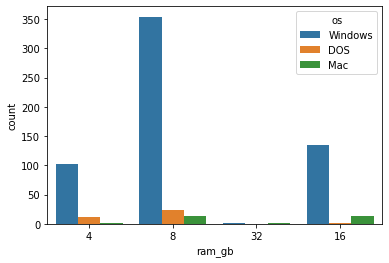

In [58]:
se.countplot(data = df_laptop, x = 'ram_gb', hue = 'os')

In [12]:
print("processor brands: " , df_laptop.processor_brand.unique())
print("processor Generation: " , df_laptop.processor_gnrtn.unique())
print("Ram Type: " , df_laptop.ram_type.unique())
print("Ram Size: " , df_laptop.ram_gb.unique())
print("SSD Size: " , df_laptop.ssd.unique())
print("HardDrive size: " , df_laptop.hdd.unique())
print("Touchscreen: " , df_laptop.Touchscreen.unique())

processor brands:  ['1' '0' '2' '3']
processor Generation:  ['10' '11' '7' '8' '9' '4' '12']
Ram Type:  ['2' '4' '3' '0' '1' '5']
Ram Size:  ['4' '8' '32' '16']
SSD Size:  ['0' '128' '256' '32' '512' '1024' '2048' '3072']
HardDrive size:  ['1024' '512' '0' '2048']
Touchscreen:  ['0' '1']


In [13]:
y = df_laptop.latest_price
laptop_features = ['processor_brand','processor_gnrtn','ram_type', 'ram_gb', 'ssd', 'hdd','Touchscreen']
X = df_laptop[laptop_features]
train_X, val_X, train_y, val_y = train_test_split(X, y, random_state = 1)

In [14]:
X.describe()

,processor_brand,processor_gnrtn,ram_type,ram_gb,ssd,hdd,Touchscreen
count,657,657,657,657,657,657,657
unique,4,7,6,4,8,4,2
top,0,11,2,8,512,0,0
freq,614,346,557,391,312,484,579


# **Stage 2**

Question can you predict the price of a laptop based on its features

# **Stage 3**

Cleaning the data

*Most cleaning done prior for charts

In [74]:
df_laptop.isnull().sum()

brand              0
model              0
processor_brand    0
processor_name     0
processor_gnrtn    0
ram_gb             0
ram_type           0
ssd                0
hdd                0
os                 0
os_bit             0
graphic_card_gb    0
weight             0
display_size       0
warranty           0
Touchscreen        0
msoffice           0
latest_price       0
old_price          0
discount           0
star_rating        0
ratings            0
reviews            0
dtype: int64

# **Stage 4 & 5**
Develop, Train and Improve Model

In [61]:
#Decsision Tree Regressor
laptop_model = DecisionTreeRegressor(random_state=10)

#Fit model
laptop_model.fit(X, y)

DecisionTreeRegressor(random_state=10)

In [63]:
laptop_model.score(X, y)

0.7776334545941596

In [65]:
print("Predict price on top 5 Laptops:")
print(X.head())
print("Predicted prices are: " , laptop_model.predict(X.head()))
print(y.head())

Predict price on top 5 Laptops:
  processor_brand processor_gnrtn ram_type ram_gb  ssd   hdd Touchscreen
0               1              10        2      4    0  1024           0
1               1              10        2      4    0   512           0
2               1              10        2      4  128     0           0
3               1              10        2      4  128     0           0
4               1              10        2      4  256     0           0
Predicted prices are:  [22595.33333333 53541.66666667 20740.         20740.
 28490.        ]
0    24990
1    19590
2    19990
3    21490
4    24990
Name: latest_price, dtype: int64


In [66]:
predicted_laptop_prices = laptop_model.predict(X)
print("Average error in inr:" , mean_absolute_error(y, predicted_laptop_prices))

Average error in inr: 13426.079525939269


In [67]:
#Takes a while
fig = plt.figure(figsize=(250,250))
_ = tree.plot_tree(laptop_model, feature_names=laptop_features, filled=True)

In [68]:
laptop_model_train_test = DecisionTreeRegressor()
#Fit model
laptop_model_train_test.fit(train_X, train_y)

#Get predicted prices on validation data
val_predictions = laptop_model_train_test.predict(val_X)
print("Average error in inr:" , mean_absolute_error(val_y, val_predictions))

Average error in inr: 19449.50093481088


In [69]:
#Get Mean Average Error
def get_mae(max_leaf_nodes, train_X, val_X, train_y, val_y):
    model = DecisionTreeRegressor(max_leaf_nodes=max_leaf_nodes, random_state=0)
    model.fit(train_X, train_y)
    preds_val = model.predict(val_X)
    mae = mean_absolute_error(val_y, preds_val)
    return(mae)

Max leafs made mean absolute error higher

In [70]:
for max_leaf_nodes in [10,20,30,40,50,60,70,80,90,100,110]:
    my_mae = get_mae(max_leaf_nodes, train_X, val_X, train_y, val_y)
    print("Max leaf nodes: %d  \t\t Mean Absolute Error:  %d" %(max_leaf_nodes, my_mae))

Max leaf nodes: 10  		 Mean Absolute Error:  22795
Max leaf nodes: 20  		 Mean Absolute Error:  20270
Max leaf nodes: 30  		 Mean Absolute Error:  20544
Max leaf nodes: 40  		 Mean Absolute Error:  19541
Max leaf nodes: 50  		 Mean Absolute Error:  19437
Max leaf nodes: 60  		 Mean Absolute Error:  19304
Max leaf nodes: 70  		 Mean Absolute Error:  19527
Max leaf nodes: 80  		 Mean Absolute Error:  19514
Max leaf nodes: 90  		 Mean Absolute Error:  19467
Max leaf nodes: 100  		 Mean Absolute Error:  19445
Max leaf nodes: 110  		 Mean Absolute Error:  19445


In [71]:
for max_leaf_nodes in [90,91,92,93,94,95,96,97,98,99,100]:
    my_mae = get_mae(max_leaf_nodes, train_X, val_X, train_y, val_y)
    print("Max leaf nodes: %d  \t\t Mean Absolute Error:  %d" %(max_leaf_nodes, my_mae))

Max leaf nodes: 90  		 Mean Absolute Error:  19467
Max leaf nodes: 91  		 Mean Absolute Error:  19437
Max leaf nodes: 92  		 Mean Absolute Error:  19437
Max leaf nodes: 93  		 Mean Absolute Error:  19440
Max leaf nodes: 94  		 Mean Absolute Error:  19443
Max leaf nodes: 95  		 Mean Absolute Error:  19443
Max leaf nodes: 96  		 Mean Absolute Error:  19443
Max leaf nodes: 97  		 Mean Absolute Error:  19443
Max leaf nodes: 98  		 Mean Absolute Error:  19444
Max leaf nodes: 99  		 Mean Absolute Error:  19445
Max leaf nodes: 100  		 Mean Absolute Error:  19445


In [72]:
fig = plt.figure(figsize=(250,250))
_ = tree.plot_tree(laptop_model_train_test, feature_names=laptop_features,filled=True)

# **Stage 6**
***Present results and Conclusions***

The aim of this project was to determine to price of a laptop when given the features of the laptop. The laptop features consisted of RAM, processor type, hard drive space, ssd space and several others.

The data had many missing values, in particular the screen size which had over 300 "Missing"s alone. I however did not see this as presenting a significant problem in the data.

I used a decision tree regressor algorithm for this project.

In conclusion it seemed to prove possible to predict these prices as would be expected, given that in most cases the price would be based on this.